In [1]:
import os
import pennylane as qml
import tensorflow as tf
import pandas as pd
import numpy as np
from tensorflow.keras.layers import LeakyReLU
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

2026-02-03 15:25:16.690822: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-02-03 15:25:17.194183: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64/openmpi/lib:/usr/local/cuda/lib64:/opt/intel/oneapi/lib/intel64:/opt/nvidia/cudaq/lib:/opt/postgresql/12.4/lib
2026-02-03 15:25:17.194300: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64/openmpi/lib:/usr/local/cuda/lib64:/opt/intel/oneapi/lib/intel64:/opt/nvidia/cudaq/lib:/opt/postgresql/12.4/lib
2026-02-03 15:25:17.194307: W tensorflow/compiler/tf

In [2]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  # Restrict access of TensorFlow to specific GPU
  try:
    tf.config.experimental.set_visible_devices(gpus[1], 'GPU')
  except RuntimeError as e:
    # Visible devices must be set at program startup
    print(e)

tf.config.experimental.get_visible_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]

In [3]:
experiment_configs = [
    {"ansatz": "QNN", "lookback": 1},
    {"ansatz": "QNN", "lookback": 2},
    {"ansatz": "Wavelets", "lookback": 1},
    {"ansatz": "Wavelets", "lookback": 2},
]
prevision_window=[1,2,3,4,5,6]
max_layers = 4

# Importing Models

In [4]:
def qnode_circuit(inputs, weights):
    # weights: (n_layers,n_qubits,3)
    n_layers = len(weights)
    n_qubits = len(weights[0])
    
    ###############
    # Feature Map #
    ###############
    for idx in range(n_qubits):
        qml.Hadamard(wires=idx)
    qml.templates.AngleEmbedding(inputs, rotation='Y', wires=range(n_qubits))
    
    ##########
    # Ansatz #
    ##########
    for k in range(n_layers):
        # Variational Layer
        for i in range(len(weights[k])):
            qml.Rot(*weights[k][i],wires=i)

        # Entangling Layer
        for i in range(0, n_qubits-1): 
            qml.CNOT(wires=[i, i + 1])
        qml.CNOT(wires=[n_qubits-1, 0])
    
    ###############
    # Measurement #
    ###############
    return [qml.expval(qml.PauliZ(wires=i)) for i in range(n_qubits)]


In [5]:
def create_quantum_model(n_qubits, weights, prev):
    input_layer = tf.keras.layers.Input(shape=(n_qubits,))
    
    dev = qml.device("default.qubit", wires=n_qubits)
    qnn = qml.QNode(qnode_circuit, dev, interface="tf")
    q_layer = qml.qnn.KerasLayer(qnn, weights, output_dim=n_qubits)

    activation=tf.keras.layers.Activation(tf.keras.activations.relu)
    output_layer = tf.keras.layers.Dense(len(prev), LeakyReLU(alpha=0.01))

    model = tf.keras.models.Sequential([
        input_layer
        , q_layer
        , activation
        , output_layer])
    
    opt = tf.keras.optimizers.Adam(learning_rate = 0.001)
    
    model.compile(loss=['mse'], optimizer=opt, metrics=['mae'])
    
    return model

In [6]:
all_models = {}

#for config in experiment_configs:
    #ansatz = config["ansatz"]
    #lookback = config["lookback"]
ansatz = "QNN"
lookback = 1
SUBDIR = f"Ansatz-{ansatz}-Lookback-{lookback}"

print(f"\n==============================")
print(f"Processando: Ansatz={ansatz}, Lookback={lookback}")
print(f"==============================")

if ansatz == "QNN":
    if lookback == 1:
        nqubits = 16
    else:
        nqubits = 32
else:
    if lookback == 1:
        nqubits = 86
    else:
        nqubits = 172

path_chk = os.path.abspath(os.path.join(os.getcwd(), 'checkpoint', SUBDIR))
if not os.path.exists(path_chk):
    os.makedirs(path_chk)

for i in range(max_layers):
    weight_shapes = {"weights": (i+1,nqubits,3)}
    model = create_quantum_model(nqubits, weight_shapes, prevision_window)
    model.load_weights(os.path.join(path_chk, f'cp-{ansatz}-lookback-{lookback}-depth-{i+1}-0100.ckpt'))
    all_models[ansatz+"-"+str(lookback)+"-"+str(i+1)] = model



Processando: Ansatz=QNN, Lookback=1


# Data Loading

In [7]:
def load_table(path, prev, lookback):
    X = pd.read_csv(path)
    X.dropna(axis=0,how='any',inplace=True)
    
    # We remove all outliers from dataset
    X = X[X['EXT_PM_25'] < 1000] 

    if lookback > 1:
        for col in X.columns:
            X[col+'_Lookback'] = X.loc[:,col].shift(lookback-1)
        X = X.iloc[lookback-1:, :]

    # We copy the values in X to prepare the y dataset. The first row is removed from y 
    # since it does not have a previous value to serve as forecast
    y = X[:].drop(X.index[0])
    
    # We remove the last line in X since it doesn't have an equivalent y
    X = X.iloc[:-prev[-1],:]
    
    # We create the final y dataset by creating a new column with the predictions and 
    # removing the unnecessary information
    for i in prev:
        y[f'Prev {i} hour'] = y.loc[:,"EXT_PM_25"].shift(-(i-1))
    
    if prev[-1] == 1:
        y= y.iloc[:, -1:]
    else:
        y= y.iloc[:-(prev[-1]-1), -len(prev):]

    return X, y.values

In [8]:
print("\nLoading Datasets\n")
path_stoke = os.path.abspath(os.path.join(os.getcwd(), 'data', 'stoke'))
path_suther = os.path.abspath(os.path.join(os.getcwd(), 'data', 'suther'))

filename_train = "wavelets-lvl5-train.csv" if ansatz == "Wavelets" else "train.csv"
filename_test  = "wavelets-lvl5-test.csv"  if ansatz == "Wavelets" else "test.csv"

train_file_stoke  = os.path.join(path_stoke, filename_train)
train_file_suther = os.path.join(path_suther, filename_train)
test_file_stoke   = os.path.join(path_stoke, filename_test)
test_file_suther  = os.path.join(path_suther, filename_test)

print(f"importing data from {train_file_stoke}")
X_train_stoke, y_train_stoke = load_table(train_file_stoke, prevision_window, lookback)
print(f"importing data from {train_file_suther}")
X_train_suther, y_train_suther = load_table(train_file_suther, prevision_window, lookback)

X_all = pd.concat([X_train_stoke, X_train_suther], axis=0)
y_all = np.vstack((y_train_stoke,y_train_suther))

#X_all = X_train_stoke
#y_all = y_train_stoke


print(f"importing data from {test_file_stoke}")
X_test_stoke, y_test_stoke = load_table(test_file_stoke, prevision_window, lookback)
print(f"importing data from {test_file_suther}")
X_test_suther, y_test_suther = load_table(test_file_suther, prevision_window, lookback)

X_test = pd.concat([X_test_stoke, X_test_suther], axis=0)
y_test = np.vstack((y_test_stoke,y_test_suther))

#X_test = X_test_stoke
#y_test = y_test_stoke


plot_time = X_test['Time'].values


Loading Datasets

importing data from /home/otto.pires/dynex-poc/data/stoke/train.csv
importing data from /home/otto.pires/dynex-poc/data/suther/train.csv
importing data from /home/otto.pires/dynex-poc/data/stoke/test.csv
importing data from /home/otto.pires/dynex-poc/data/suther/test.csv


In [9]:
if lookback > 1:
    X_all = X_all.drop(["Time", "Month", "Time_Lookback", "Month_Lookback"], axis=1)
    X_test = X_test.drop(["Time", "Month", "Time_Lookback", "Month_Lookback"], axis=1)
else:
    X_all = X_all.drop(["Time", "Month"], axis=1)
    X_test = X_test.drop(["Time", "Month"], axis=1)

In [10]:
print(f"\nThere are {X_all.shape[1]} features and {X_all.shape[0]} instances in All Train set\n")
print(X_all.head())
print(f"\nThere are {X_test.shape[1]} features and {X_test.shape[0]} instances in All Test set\n")
print(X_test.head())


There are 16 features and 4352 instances in All Train set

        TEMP        HUM       PRESS  EXT_PM_25    CO_PRE    NO2_PRE  \
0  14.305167  46.894333  101.311333  12.333333  0.235167  14.397885   
1  13.923167  46.929833  101.320000  15.016667  0.226035  16.237973   
2  13.794167  47.107667  101.349667  17.533333  0.219977  16.949071   
3  13.798500  47.212667  101.387333  18.966667  0.218026  16.976633   
4  13.862167  47.418500  101.429167  13.700000  0.215322  16.410233   

      O3_PRE  SIN HOUR  COS HOUR   SIN DAY  COS DAY  SIN MONTH     COS MONTH  \
0  21.885943  0.000000  1.000000  0.201299  0.97953        1.0  6.123234e-17   
1  18.874601  0.258819  0.965926  0.201299  0.97953        1.0  6.123234e-17   
2  18.829282  0.500000  0.866025  0.201299  0.97953        1.0  6.123234e-17   
3  19.074056  0.707107  0.707107  0.201299  0.97953        1.0  6.123234e-17   
4  19.427294  0.866025  0.500000  0.201299  0.97953        1.0  6.123234e-17   

         LAT      LONG  ALT  
0 

In [11]:
print("\nScaling Data\n")
scaler_x = MinMaxScaler(feature_range=(0, 1))
Xs_all  = scaler_x.fit_transform(X_all)
Xs_test = scaler_x.transform(X_test)


Scaling Data



In [12]:
print("\nSplitting Train Data\n")
train_ratio = 0.7
Xs_train, Xs_val, y_train, y_val = train_test_split(Xs_all, y_all, test_size=1 - train_ratio)


Splitting Train Data



In [13]:
print(f"There are {Xs_train.shape[1]} features and {Xs_train.shape[0]} instances in Train set")
print(f"There are {Xs_val.shape[1]} features and {Xs_val.shape[0]} instances in Val set")
print(f"There are {Xs_test.shape[1]} features and {Xs_test.shape[0]} instances in Test set")

There are 16 features and 3046 instances in Train set
There are 16 features and 1306 instances in Val set
There are 16 features and 1476 instances in Test set


# Evaluating Models

In [14]:
from utils.statistics import quantitative_analysis, get_mean_left_right_error_interval

In [15]:
def plot_history(n_layers, history, ansatz, lookback):
    plt.figure(figsize=(14,5), dpi=320, facecolor='w', edgecolor='k')
    plt.title(f"Quantum Model - {ansatz} - Loss for depth {n_layers} - Lookback {lookback}")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.plot(history.history['loss'], label="Loss/Epoch")
    plt.plot(history.history['val_loss'], label="Val Loss/Epoch")
    plt.xticks(range(0, len(history.history['loss'])+1, 30))
    plt.legend()
    plt.grid()
    
    path = os.path.abspath(os.path.join(os.getcwd(), 'plots', SUBDIR))
    os.makedirs(path, exist_ok=True)
    filename = f"loss-history-pollution-{ansatz}-{n_layers}-layers-lookback-{lookback}.png"
    print(f"Saving history in {os.path.join(path,filename)}")
    plt.savefig(os.path.join(path,filename))

    plt.show()

    values = np.array([list(range(1, len(history.history['loss'])+1)), history.history['loss'], history.history['val_loss']])
    loss_pd = pd.DataFrame(np.transpose(values))
    loss_pd.columns = ["Epoch", "Loss", "Val Loss"]
    loss_pd = loss_pd.set_index("Epoch")
    path = os.path.abspath(os.path.join(os.getcwd(), 'analysis', SUBDIR))
    os.makedirs(path, exist_ok=True)
    filename = f"loss-pollution-{ansatz}-{n_layers}-layers-lookback-{lookback}.csv"
    loss_pd.to_csv(os.path.join(path,filename))

In [16]:
def plot_prediction_versus_observed(n_layers, y_test, y_pred, mean_error_normal, ansatz, lookback, prev):
    
    for i in range(len(prev)):
        fig, ax = plt.subplots(figsize=(20,5), dpi=320, facecolor='w', edgecolor='k')
        plt.title(f"Quantum Model - {ansatz} - Lookback {lookback} - PM25 quantity for {prev[i]} hours ahead")
        plt.xlabel("Time")
        plt.ylabel("PM 2.5 (g/m³)")
        
        plt.plot(y_pred[:,i], label="Prediction", color='blue')
        plt.fill_between(range(y_pred.shape[0]), y_pred[:,i]-mean_error_normal[0,i], y_pred[:,i]+mean_error_normal[0,i], color='blue', alpha=0.05)
        plt.plot(y_test[:,i], label="Original", color='orange')
        plt.xticks(rotation=45)
        
        plt.legend()

        path = os.path.abspath(os.path.join(os.getcwd(), 'plots', SUBDIR))
        filename = f"prediction-pollution-{ansatz}-{n_layers}-layers-lookback-{lookback}-{prev[i]}-hours.png"
        print(f"Saving Prediction Plot in {os.path.join(path,filename)}")
        os.makedirs(path, exist_ok=True)
        plt.savefig(os.path.join(path,filename))

        plt.show()

In [17]:
all_preds = {}
for key in all_models:
    all_preds[key] = all_models[key].predict(Xs_test,verbose=1)

47/47 [==============================] - 50s 1s/step


In [18]:
for key in all_preds:
    y_pred = all_preds[key]
    _, _, depth = key.split("-")
    mean_predictions, mean_error_normal, mean_error_left_normal, mean_error_right_normal = get_mean_left_right_error_interval(model, Xs_val, y_val, y_test, y_pred)

    error_interval = [[str(i+1)+" hours"
                                  , mean_predictions[0][i]
                                  , mean_error_normal[0][i]
                                  , mean_error_left_normal[0][i]
                                  , mean_error_right_normal[0][i]
                              ] for i in range(len(mean_predictions[0]))
                             ]
    pred_interval = pd.DataFrame(error_interval)
    pred_interval.columns = ['Index', 'Mean Pred', 'Error Normal', 'Error Left', 'Error Right']
    pred_interval = pred_interval.set_index('Index')
    pred_interval.loc['Mean'] = pred_interval.mean()

    path = os.path.abspath(os.path.join(os.getcwd(), 'analysis', SUBDIR))
    os.makedirs(path, exist_ok=True)  
    filename = f"pred_interval-{ansatz}-lookback-{lookback}-depth-{depth}.csv"
    print(f"Saving Pred Interval in {os.path.join(path,filename)}")
    pred_interval.to_csv(os.path.join(path,filename), index=False)


    

41/41 [==============================] - 44s 1s/step
Saving Pred Interval in /home/otto.pires/dynex-poc/analysis/Ansatz-QNN-Lookback-1/pred_interval-QNN-lookback-1-depth-1.csv
41/41 [==============================] - 40s 976ms/step
Saving Pred Interval in /home/otto.pires/dynex-poc/analysis/Ansatz-QNN-Lookback-1/pred_interval-QNN-lookback-1-depth-2.csv
41/41 [==============================] - 40s 970ms/step
Saving Pred Interval in /home/otto.pires/dynex-poc/analysis/Ansatz-QNN-Lookback-1/pred_interval-QNN-lookback-1-depth-3.csv
41/41 [==============================] - 40s 974ms/step
Saving Pred Interval in /home/otto.pires/dynex-poc/analysis/Ansatz-QNN-Lookback-1/pred_interval-QNN-lookback-1-depth-4.csv


Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-1-layers-lookback-1-1-hours.png


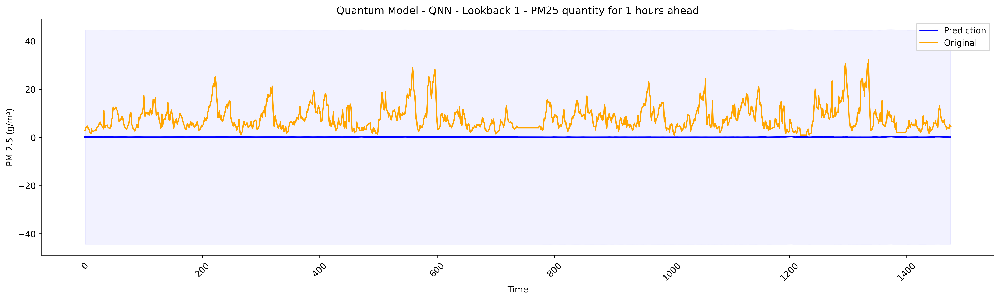

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-1-layers-lookback-1-2-hours.png


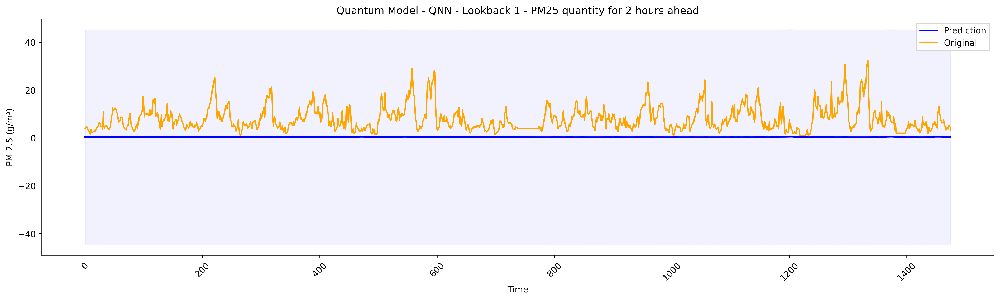

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-1-layers-lookback-1-3-hours.png


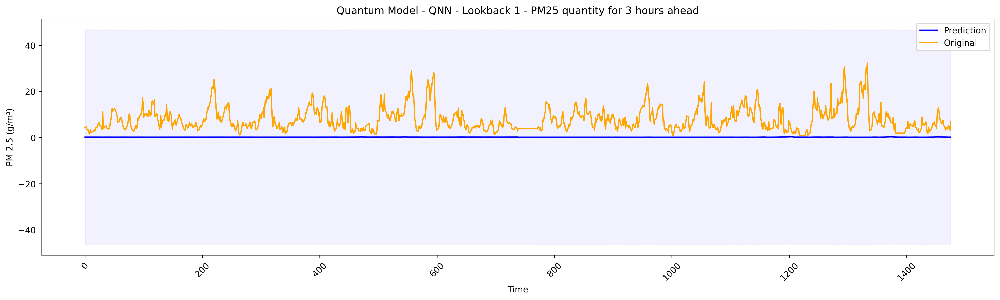

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-1-layers-lookback-1-4-hours.png


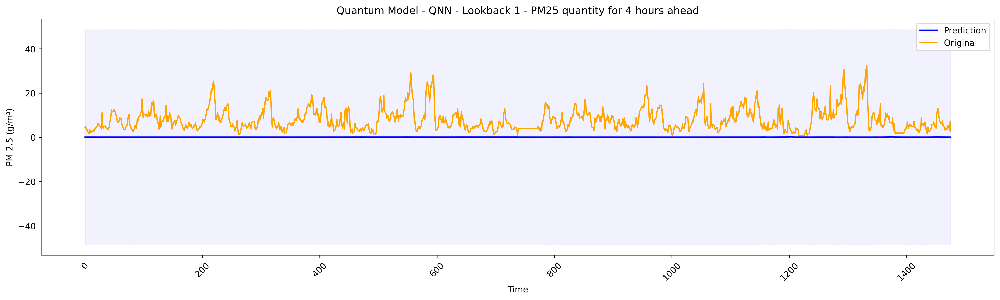

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-1-layers-lookback-1-5-hours.png


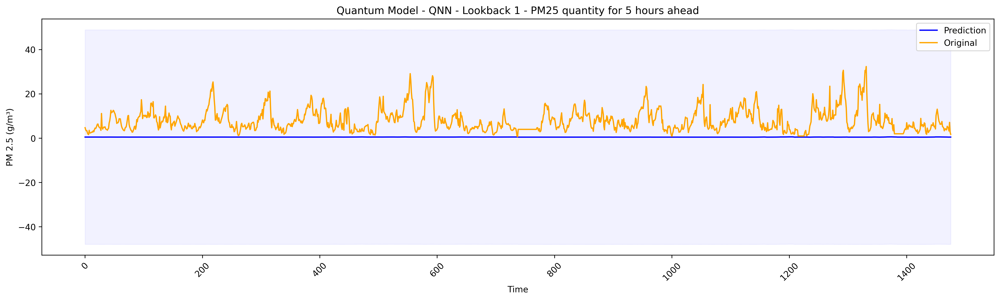

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-1-layers-lookback-1-6-hours.png


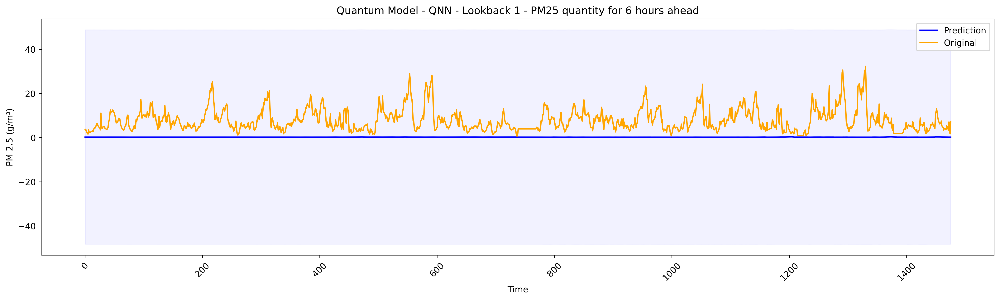

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-2-layers-lookback-1-1-hours.png


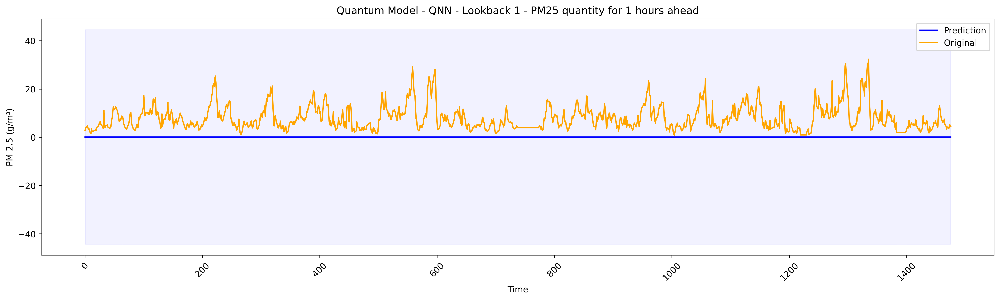

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-2-layers-lookback-1-2-hours.png


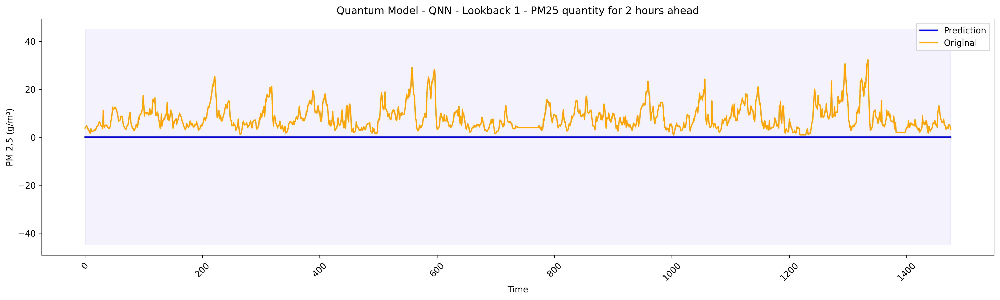

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-2-layers-lookback-1-3-hours.png


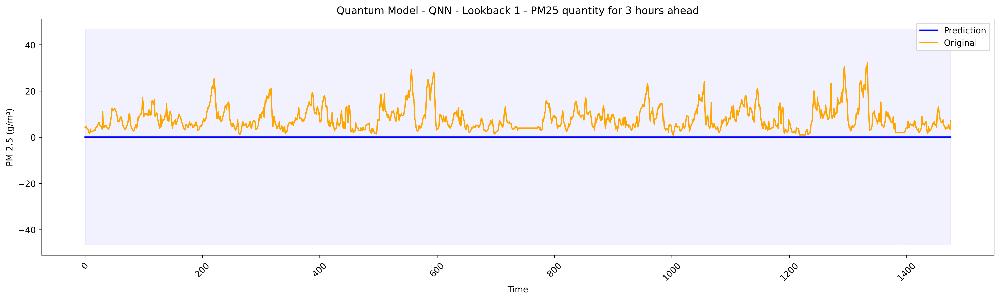

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-2-layers-lookback-1-4-hours.png


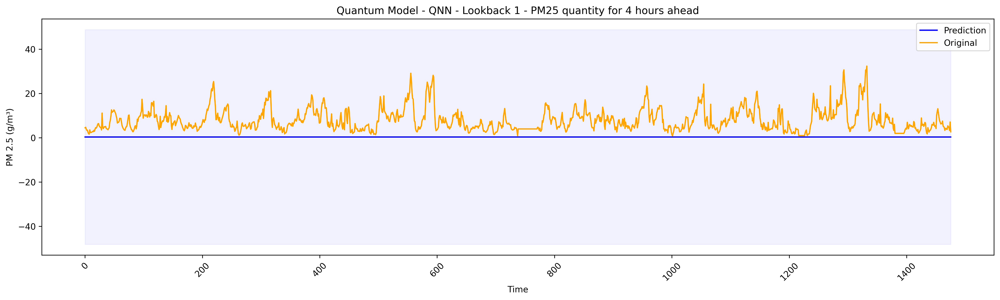

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-2-layers-lookback-1-5-hours.png


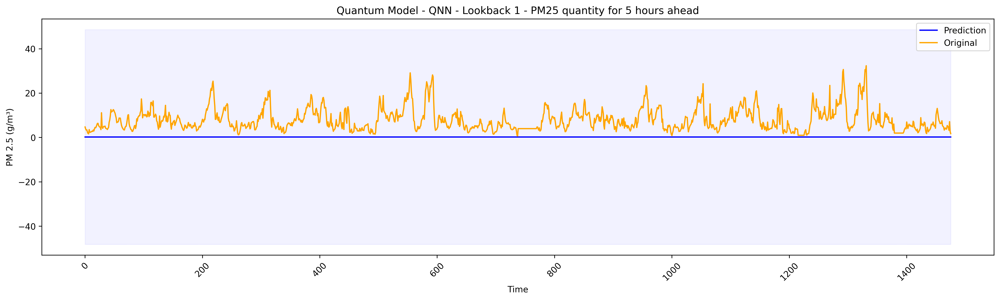

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-2-layers-lookback-1-6-hours.png


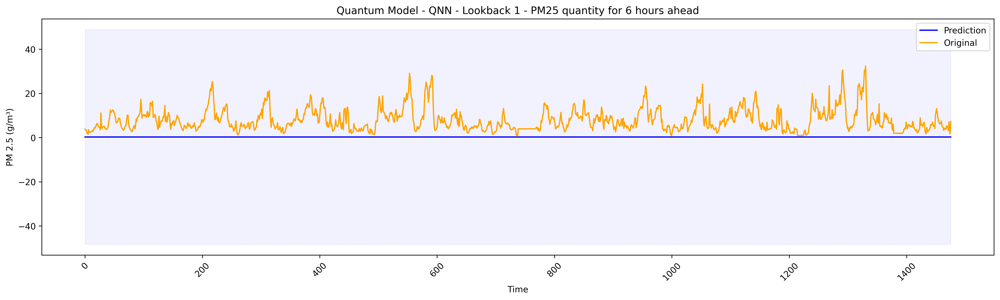

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-3-layers-lookback-1-1-hours.png


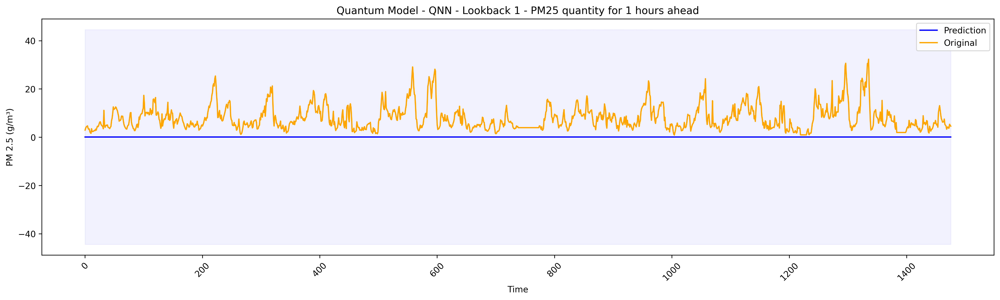

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-3-layers-lookback-1-2-hours.png


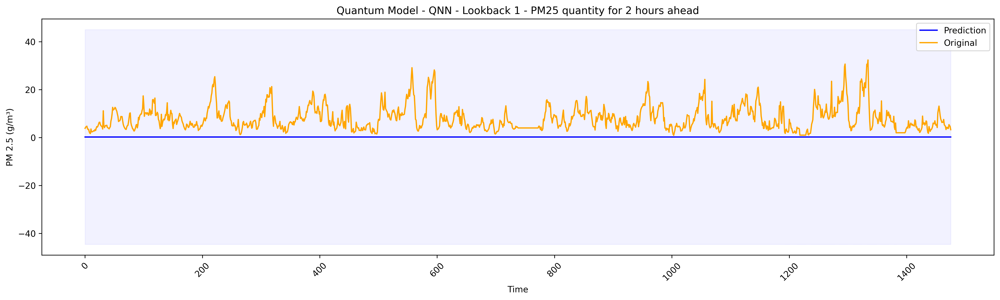

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-3-layers-lookback-1-3-hours.png


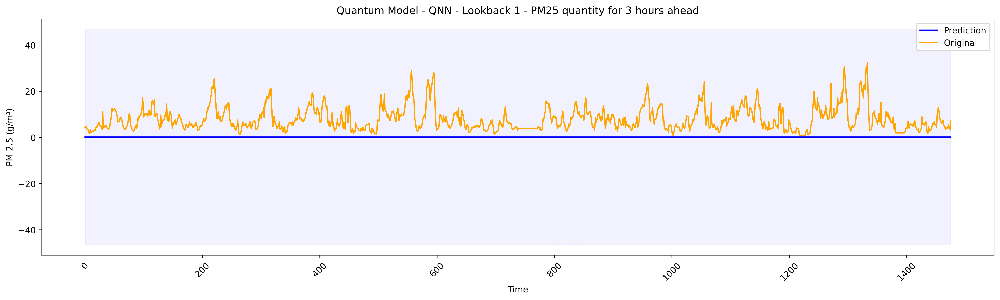

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-3-layers-lookback-1-4-hours.png


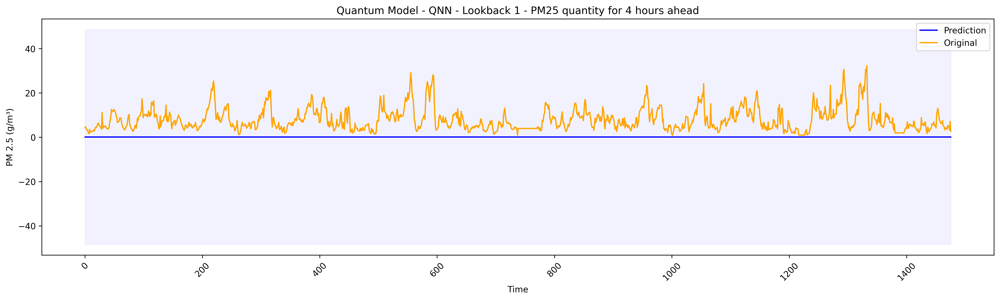

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-3-layers-lookback-1-5-hours.png


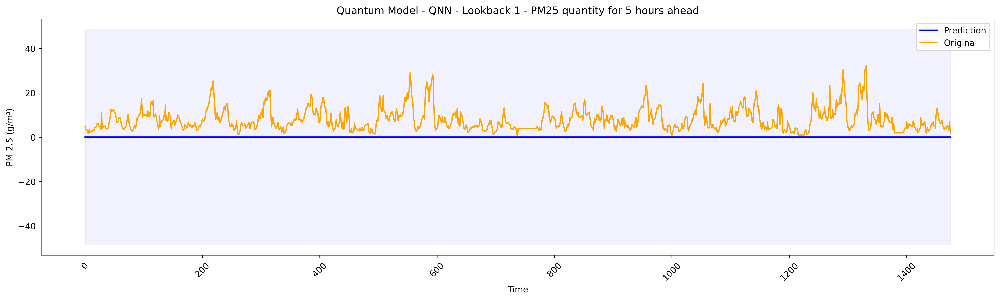

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-3-layers-lookback-1-6-hours.png


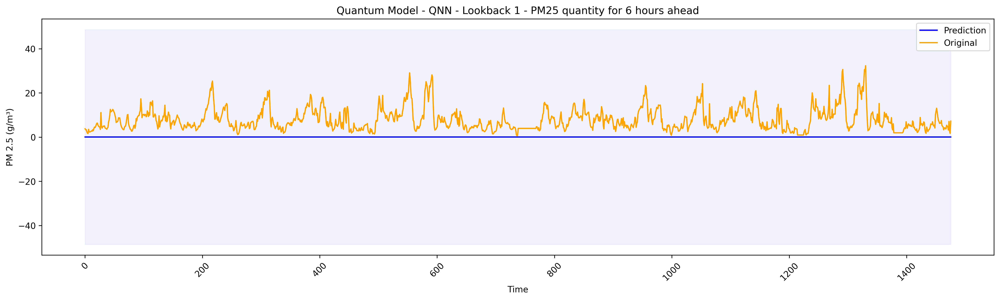

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-4-layers-lookback-1-1-hours.png


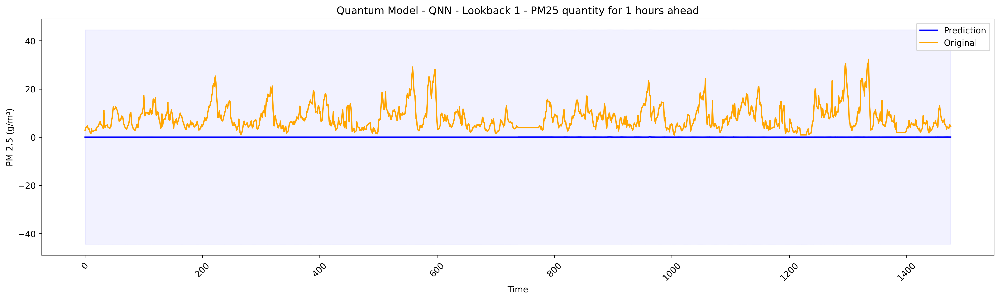

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-4-layers-lookback-1-2-hours.png


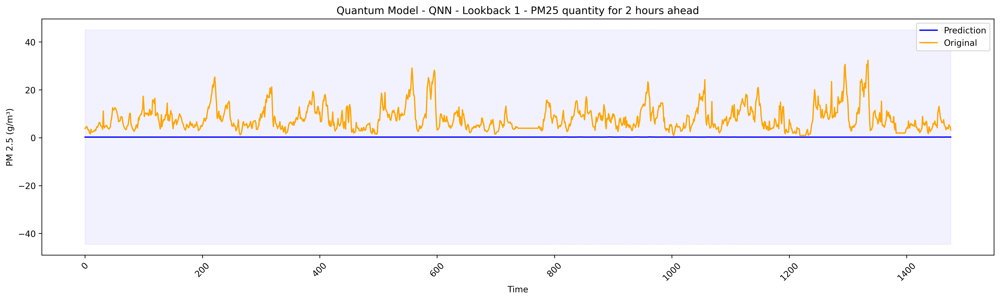

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-4-layers-lookback-1-3-hours.png


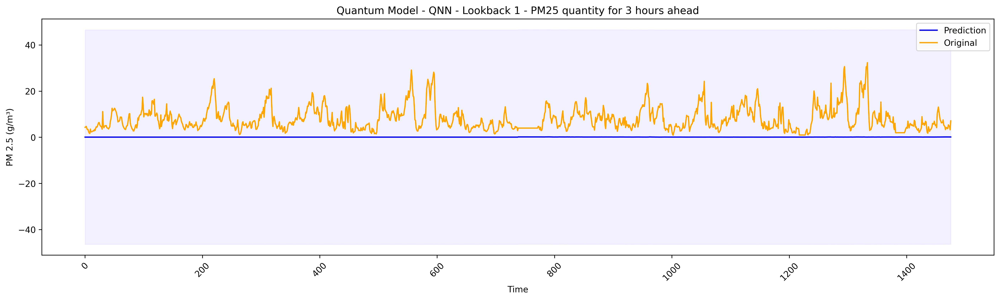

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-4-layers-lookback-1-4-hours.png


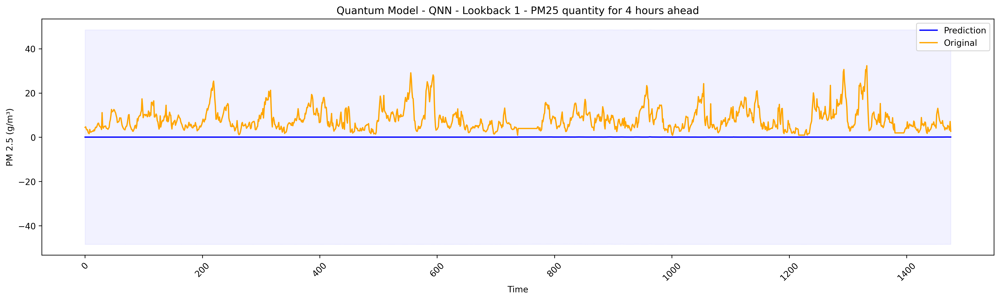

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-4-layers-lookback-1-5-hours.png


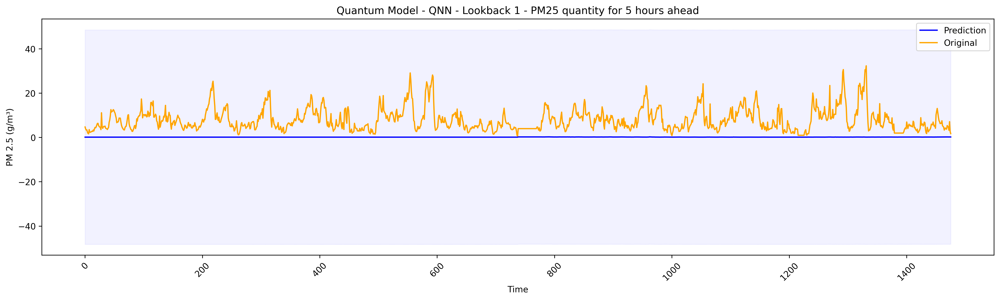

Saving Prediction Plot in /home/otto.pires/dynex-poc/plots/Ansatz-QNN-Lookback-1/prediction-pollution-QNN-4-layers-lookback-1-6-hours.png


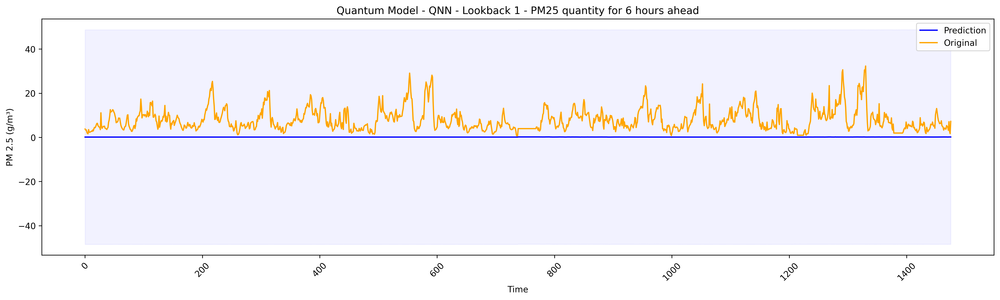

In [19]:
for key in all_preds:
    y_pred = all_preds[key]
    _, _, depth = key.split("-")
    
    plot_prediction_versus_observed(depth, y_test, y_pred, mean_error_normal, ansatz, lookback, prevision_window)

In [20]:
for key in all_preds:
    y_pred = all_preds[key]
    _, _, depth = key.split("-")

    all_analysis = quantitative_analysis(y_test, y_pred)
    all_analysis

    path = os.path.abspath(os.path.join(os.getcwd(), 'analysis', SUBDIR))
    os.makedirs(path, exist_ok=True)  

    filename = f"metrics-{ansatz}-lookback-{lookback}-depth-{depth}.csv"
    print(f"Saving Metrics in {os.path.join(path, filename)}")

    all_analysis.to_csv(os.path.join(path, filename))

    print("\n#########\n")


1 hours ahead
MAE: 7.889178773175922
MSE: 87.7432242013834
NMSE: 3.4420817146847638
RMSE: 9.367135325241298
NRMSE: 1.8552848068921288
R: -0.0995218101663298
R²: -2.444415329406584
Fator de 2: 0.0

2 hours ahead
MAE: 7.649068694182797
MSE: 84.000051138494
NMSE: 3.2956339253571056
RMSE: 9.165154179744823
NRMSE: 1.8153880922152998
R: -0.09787857458263571
R²: -2.2978682534420938
Fator de 2: 0.0

3 hours ahead
MAE: 7.772499259846669
MSE: 85.90449167137615
NMSE: 3.3709494142157745
RMSE: 9.2684676010318
NRMSE: 1.8360145462974347
R: -0.09225710095965692
R²: -2.373234803649141
Fator de 2: 0.0

4 hours ahead
MAE: 7.86237256908966
MSE: 87.33227865380474
NMSE: 3.4225738176163385
RMSE: 9.34517408365434
NRMSE: 1.8500199505995438
R: -0.1329299532593384
R²: -2.424894206645231
Fator de 2: 0.0

5 hours ahead
MAE: 7.519503899447639
MSE: 82.11327715560937
NMSE: 3.21254368718577
RMSE: 9.061637664109583
NRMSE: 1.7923570200118533
R: -0.11733997046098346
R²: -2.2147216829058958
Fator de 2: 0.009485095

6 hou